In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
from tl_classifier import TLClassifier
from scipy import misc
from os import path
from glob import glob
import random
import numpy as np

In [157]:
TLClassifier??

In [3]:
model = TLClassifier("models/tl_model")

In [4]:
%time imgs = np.array([misc.imread(f) for f in glob("../../../review/1/raw_imgs/*.png")])

CPU times: user 12.1 s, sys: 888 ms, total: 13 s
Wall time: 20.9 s


In [5]:
# imgs = np.array([misc.imresize(img, [1368, 1096]) for img in imgs])

In [6]:
imgs[0].shape

(600, 800, 3)

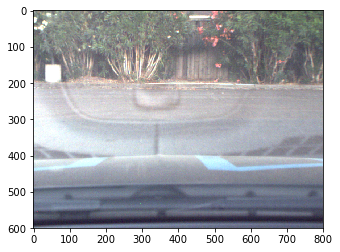

In [7]:
plt.imshow(imgs[0])

In [8]:
%time preds = np.array([model.get_classification(img) for img in imgs])

INFO:tensorflow:Restoring parameters from models/tl_model
CPU times: user 8.3 s, sys: 864 ms, total: 9.16 s
Wall time: 15.2 s


In [9]:
red_imgs_index = np.where(preds=="red")[0]
green_imgs_index = np.where(preds=="green")[0]
len(red_imgs_index), len(green_imgs_index)

(790, 159)

In [10]:
np.random.shuffle(red_imgs_index)
np.random.shuffle(green_imgs_index)

red_sample = imgs[red_imgs_index][:32]
green_sample = imgs[green_imgs_index][:32]

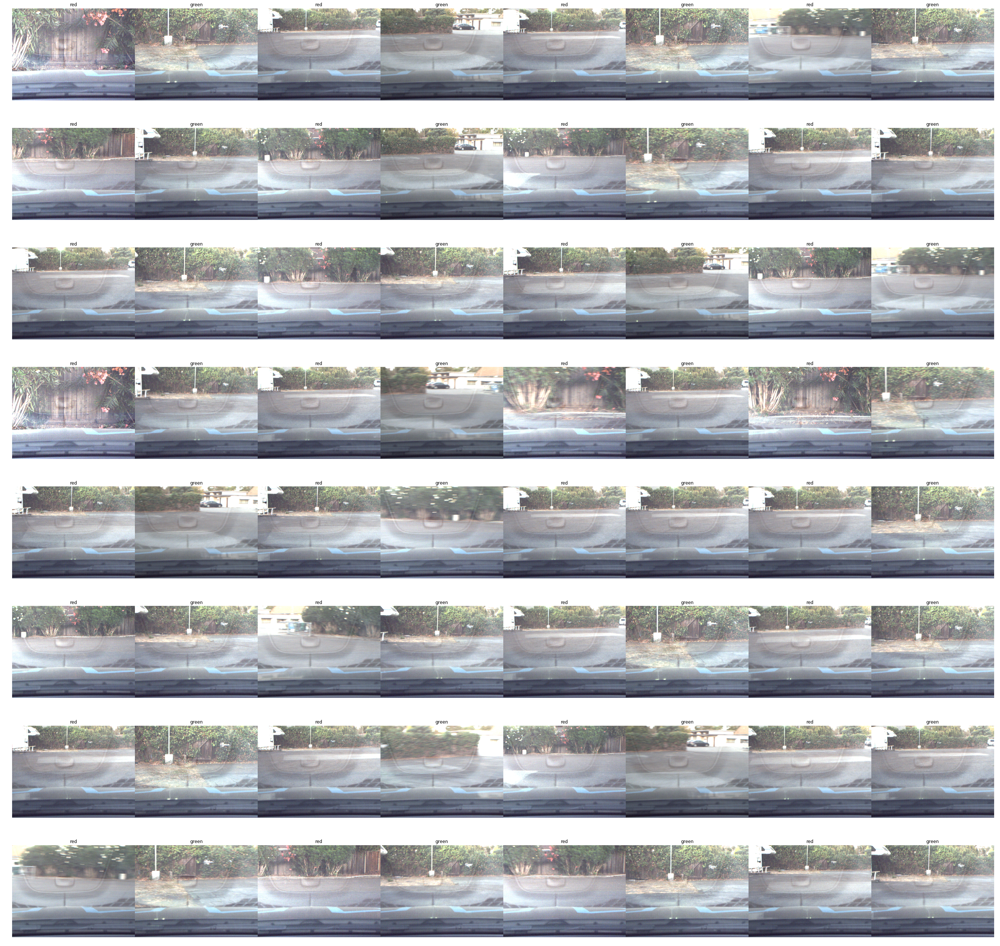

In [11]:
fig, axes = plt.subplots(8, 8, figsize=(6*8, 6*8))
fig.subplots_adjust(hspace=0, wspace=0)
axes = axes.reshape([-1, 2])

for i, rimg in enumerate(red_sample):
    axes[i, 0].imshow(rimg)
    axes[i, 0].set_axis_off()
    axes[i, 0].set_title("red")
    
for i, gimg in enumerate(green_sample):
    axes[i, 1].imshow(gimg)
    axes[i, 1].set_axis_off()
    axes[i, 1].set_title("green")

## training images different from test?

In [73]:
train_img_folder = "../../data/camera_training/train/"
green = misc.imread(glob(path.join(train_img_folder, "green/*"))[0])
red = misc.imread(glob(path.join(train_img_folder, "red/*"))[0])
yellow = misc.imread(glob(path.join(train_img_folder, "yellow/*"))[0])
nolight = misc.imread(glob(path.join(train_img_folder, "nolight/*"))[0])

In [48]:
import tensorflow as tf

In [55]:
tf.reset_default_graph()
gd = tf.GraphDef()
gd.ParseFromString(tf.gfile.GFile("frozen_inference_graph.pb", "rb").read())
tf.import_graph_def(gd, name="object_detection_api")
sess = tf.Session()

In [58]:
img = green

In [59]:
g = tf.get_default_graph()
image = g.get_tensor_by_name("object_detection_api/image_tensor:0")
boxes = g.get_tensor_by_name("object_detection_api/detection_boxes:0")
scores = g.get_tensor_by_name("object_detection_api/detection_scores:0")
classes = g.get_tensor_by_name("object_detection_api/detection_classes:0")

pred_boxes, pred_scores, pred_classes = sess.run(
                                            [boxes, scores, classes],
                                            feed_dict={image: np.expand_dims(img, axis=0)})

In [60]:
## load label names - taking a shortcut
import re
def load_labels(label_path):
    id2label = {}
    
    with open(label_path, "r") as f:
        items = re.findall(r"item\s*\{[^}]*\}", f.read(), re.MULTILINE)
        for item in items:
            id = int(re.findall(r"id: (\d+)", item)[0])
            label = re.findall(r'display_name: "([\w\s]+)"', item)[0]
            id2label[id] = label
    return id2label

label_path = "mscoco_label_map.pbtxt"
id2label = load_labels(label_path)

In [151]:
def detect_objects(sess, model_graph, id2label, img, prob_thr):
    
    ## object detection

    image = model_graph.get_tensor_by_name("object_detection_api/image_tensor:0")
    boxes = model_graph.get_tensor_by_name("object_detection_api/detection_boxes:0")
    scores = model_graph.get_tensor_by_name("object_detection_api/detection_scores:0")
    classes = model_graph.get_tensor_by_name("object_detection_api/detection_classes:0")
    pred_boxes, pred_scores, pred_classes = sess.run([boxes, scores, classes],
                                                     feed_dict={image: np.expand_dims(img, axis=0)})
    
    pred_boxes = pred_boxes.squeeze()
    pred_scores = pred_scores.squeeze() # in descreding order
    pred_classes = pred_classes.squeeze()
    pred_labels = np.array([id2label.get(c) for c in pred_classes])
    
    ## draw on image
    img = img.copy()
    font = cv2.FONT_HERSHEY_COMPLEX_SMALL
    n = pred_boxes.shape[0]
#     topn = min(topn, n)
    h, w = img.shape[:2]
    for i in range(n):
        box = pred_boxes[i]
        label = pred_labels[i]
        score = pred_scores[i]
        if score < prob_thr: continue
#         if label != "traffic light": continue # traffic light
        if pred_classes[i] != 10: continue
        x0, y0 = box[1] * w, box[0] * h
        x1, y1 = box[3] * w, box[2] * h
        x0, y0, x1, y1 = map(int, [x0, y0, x1, y1])
        cv2.rectangle(img,(x0, y0),(x1, y1),(255,0,0),3)
        area = img[y0:y1, x0:x1]
        rpct = np.mean(area[:,:,0] == area[:,:,0].max())
        gpct = np.mean(area[:,:,1] == area[:,:,1].max())
        bpct = np.mean(area[:,:,2] == area[:,:,2].max())
        area_color = "r=%.2f, g=%.2f, b=%.2f" % (rpct, gpct, bpct)
        print(area_color)
        cv2.putText(img, "%s:%.2f" % (label, score), (x0+10, y0+20), font, 1.5 ,(0,0,255), 2, cv2.LINE_AA)
    return img

r=0.35, g=0.05, b=0.00


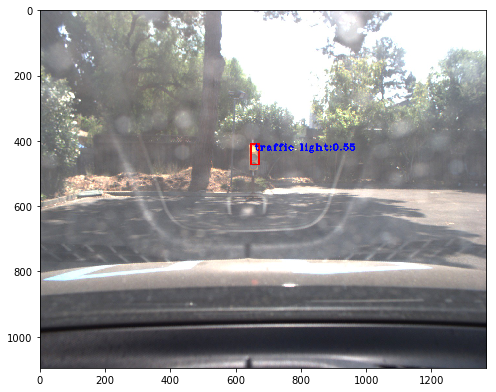

In [152]:
a = detect_objects(sess, tf.get_default_graph(), id2label, red, prob_thr=0.3)
plt.figure(figsize=(8, 8))
plt.imshow(a)

r=0.18, g=0.11, b=0.10


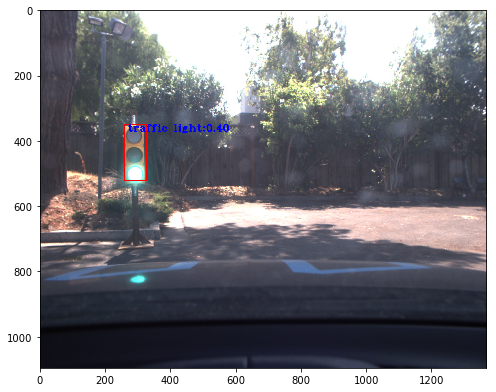

In [153]:
a = detect_objects(sess, tf.get_default_graph(), id2label, green, prob_thr=0.3)
plt.figure(figsize=(8, 8))
plt.imshow(a)

r=0.19, g=0.01, b=0.00


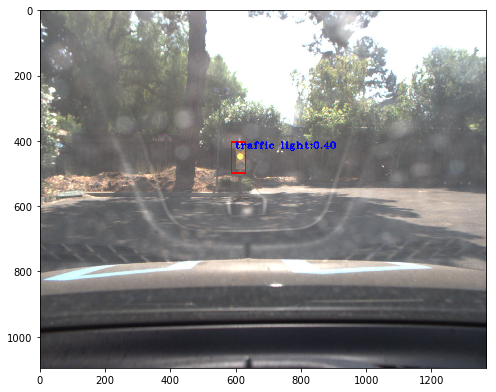

In [154]:
a = detect_objects(sess, tf.get_default_graph(), id2label, yellow, prob_thr=0.3)
plt.figure(figsize=(8, 8))
plt.imshow(a)

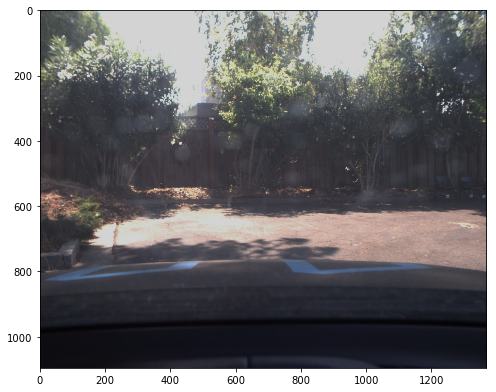

In [155]:
a = detect_objects(sess, tf.get_default_graph(), id2label, nolight, prob_thr=0.3)
plt.figure(figsize=(8, 8))
plt.imshow(a)

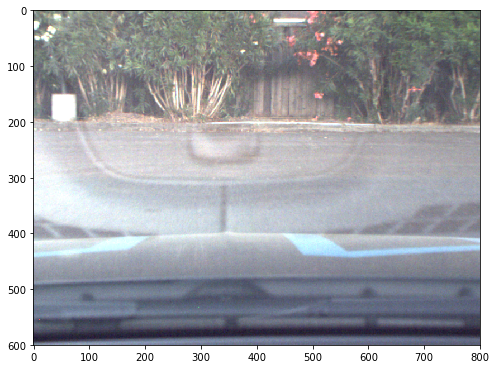

In [156]:
a = detect_objects(sess, tf.get_default_graph(), id2label, imgs[0], prob_thr=0.3)
plt.figure(figsize=(8, 8))
plt.imshow(a)